In [65]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set() #sets the matplotlib style to seaborn style

from scipy.io import loadmat 
from scipy.ndimage import convolve1d
from scipy.signal import butter
from scipy.signal import sosfiltfilt
from scipy.signal import welch
import pandas as pd

np.random.seed(42)

import plotly.express as px


Part 1 

The dataset used here is subject1's data in the second database from the Ninapro dataset (https://ninapro.hevs.ch/instructions/DB1.html). 

This dataset includes detailed information about the hand movements performed. Our objective now is to predict these movements using the EMG data by classification.

1.1. Visualize and preprocess the data for subject 2 (use only the first exercise set: S2_A1_E1 with 12 actions). 

Does the data look reasonable?

 Did you need to remove any trials?

First let's check data structure.

In [52]:
data = loadmat("s2/S2_A1_E1.mat")
print("Dataset variables:")
for key in data.keys():
    if not key.startswith("__"):
        print(key)

Dataset variables:
subject
exercise
stimulus
emg
glove
restimulus
repetition
rerepetition


In [53]:
emg = data["emg"]
print("EMG data dimension: {}".format(emg.shape))
print("EMG data type: {}".format(type(emg)))

EMG data dimension: (100686, 10)
EMG data type: <class 'numpy.ndarray'>


In [79]:
stimulus = data['restimulus'] #indicates the type of gesture or movement being performed during each time frame of the recording
repetition = data['rerepetition'] #specifies the repetition number for the gesture being performed 
                                  #identify which instance of a gesture (e.g., first repetition, second repetition, etc.) the data corresponds to

# -1 because 0 is the resting condition
n_stimuli = len(np.unique(stimulus)) - 1 
# -1 because 0 is not a repetition
n_repetitions = len(np.unique(repetition)) - 1 

print(f'How many types of movement are there? {n_stimuli}') 
print(f'How many repetitions are there? {n_repetitions}') 

How many types of movement are there? 12
How many repetitions are there? 10


VIEW RAW DATA

10


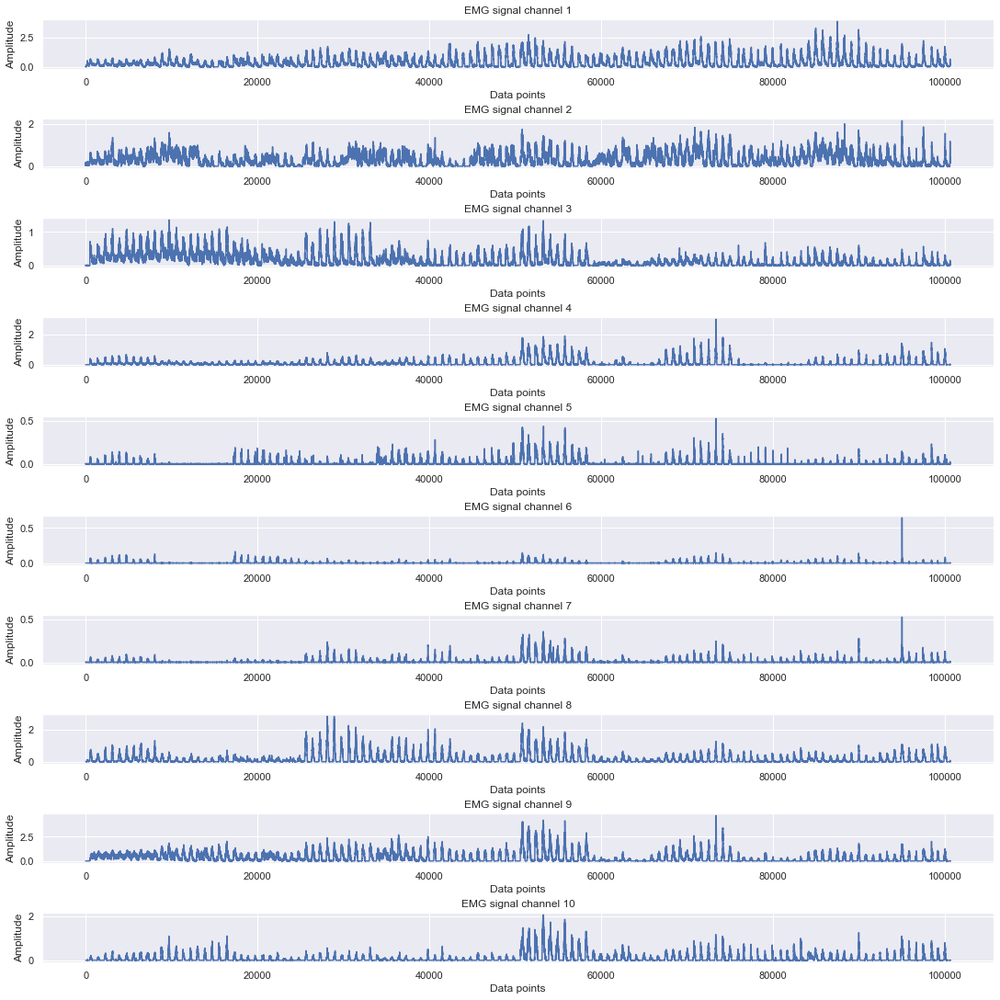

In [74]:
# Visualization of the data of the 10 channels
plt.close("all")

n_timepoints, n_channels = emg.shape

# Identify points where stimulus changes
diff = np.diff(stimulus.T).flatten()
change_points = [i + 1 for i, x in enumerate(diff) if x != 0]

fig, ax = plt.subplots(n_channels, 1, constrained_layout=True, figsize=(15, 15))
for channel_idx in range(n_channels):
    ax[channel_idx].plot(emg[:, channel_idx])   
    ax[channel_idx].set_title(f"EMG signal channel {channel_idx +1}")
    ax[channel_idx].set_xlabel("Data points")
    ax[channel_idx].set_ylabel("Amplitude")
    

Pre-processing

In [103]:
emg_rectified = data["emg"].copy()
emg_rectified.shape

(100686, 10)

Next, let's look at how many samples (a.k.a timesteps) each trial (one combination of stimulation and repeats) has.

In [91]:
number_of_samples_per_trial = np.zeros((n_stimuli, n_repetitions))

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        
        idx = np.logical_and(stimulus == stimuli_idx+1, repetition == repetition_idx+1)
        number_of_samples_per_trial[stimuli_idx, repetition_idx] = np.sum(idx.astype(int))

number_of_samples_per_trial

array([[307., 390., 262., 226., 418., 204., 196., 270., 306., 489.],
       [334., 323., 344., 309., 333., 376., 362., 307., 348., 339.],
       [465., 352., 450., 460., 436., 389., 323., 388., 383., 316.],
       [310., 402., 357., 396., 255., 333., 263., 369., 438., 471.],
       [516., 382., 425., 379., 463., 411., 387., 343., 286., 377.],
       [337., 319., 337., 368., 338., 336., 268., 354., 319., 313.],
       [428., 392., 341., 393., 421., 445., 342., 328., 329., 358.],
       [289., 372., 406., 397., 498., 336., 415., 328., 472., 405.],
       [384., 424., 371., 316., 280., 314., 342., 284., 307., 421.],
       [311., 296., 299., 296., 301., 246., 213., 317., 493., 221.],
       [352., 403., 338., 416., 330., 355., 313., 322., 329., 219.],
       [270., 330., 300., 387., 295., 204., 363., 267., 281., 329.]])

We can see that the number of samples for each trial is different. This is because of the nature of the task they have to perform.   

The subjects were asked to repeat movements on shown on the screen, however the time taken for each movements can differ: some could be longer than the other. 

It will not be possible to fit it into a tensor (e.g. vector is a 1-dimensional tensor) directly as the size is not the same throughout. 

Therefore, we will be using a nested list to contain and access the data in the subsequent analysis. 

### Window and envelope
Now, lets visualize the data. In this example, we will illustrate using data from a single trial (repetition 1 of stimulus 1) using moving average for detecting the envelope.

So emg_windows represent slices of the data that belong to the same repetition and stimulus so we can acess each trial!

In [107]:
#defining the length of the moving average window
mov_mean_length = 25
mov_mean_weights = np.ones(mov_mean_length) / mov_mean_length

#initializing the data structure
emg_windows = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]
emg_envelopes = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        idx = np.logical_and(stimulus == stimuli_idx + 1, repetition == repetition_idx + 1).flatten() #generate a boolean mask that identifies the time points in the dataset
                                                                                                     #where both the stimulus and repetition conditions are satisfied
        emg_windows[stimuli_idx][repetition_idx] = emg_rectified[idx, :] #for all channels 
        emg_envelopes[stimuli_idx][repetition_idx] = convolve1d(emg_windows[stimuli_idx][repetition_idx], mov_mean_weights, axis=0) 

Text(0.5, 0.98, 'Envelopes of the EMG signal')

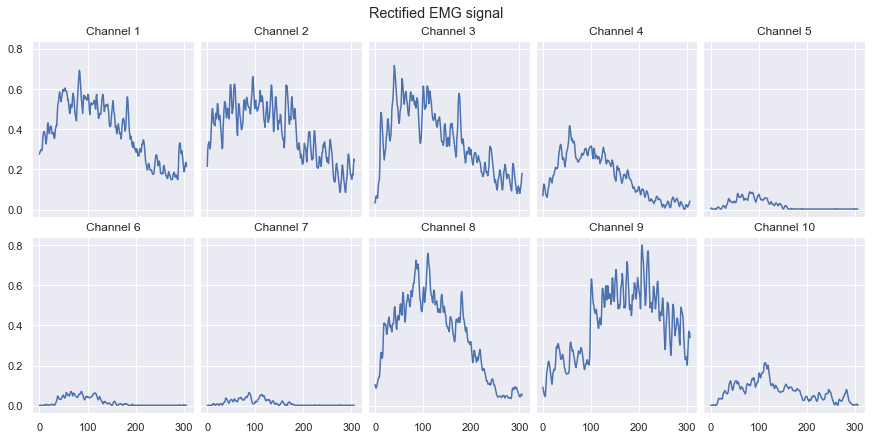

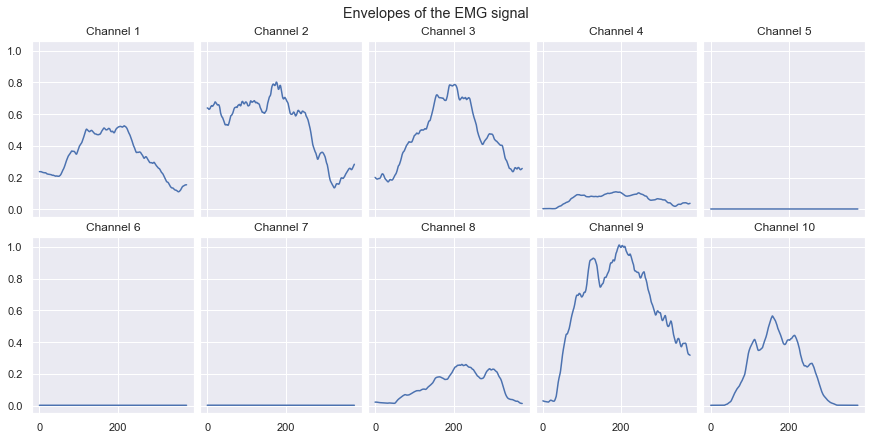

In [123]:
# Now we plot all the channels on the same y-scale
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()

number_of_emg_channels = emg_rectified.shape[-1]
# plot Rectified EMG signal
for channel_idx in range(number_of_emg_channels): 
    ax[channel_idx].plot(emg_windows[0][0][:, channel_idx])
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
plt.suptitle("Rectified EMG signal")

# plot Envelopes of the EMG signal
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()
for channel_idx in range(number_of_emg_channels): 
    ax[channel_idx].plot(emg_envelopes[1][5][:, channel_idx]) #here if you change the indexes of emg_envelop you can go over the signal for a specific repetition and stimuli 
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
plt.suptitle("Envelopes of the EMG signal")


### Visualizing across repetitions

Remember that we were only looking at a single trial in the previous section. 

To check for the robustness of the signal, we will generally need to repeat the stimulus multiple times and look at the trend of the signal quality over time.

In [95]:
emg_average_activations = np.zeros((n_channels, n_stimuli, n_repetitions))
for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        #mean across time for each channel
        emg_average_activations[:, stimuli_idx, repetition_idx] = np.mean(emg_envelopes[stimuli_idx][repetition_idx], axis=0) 

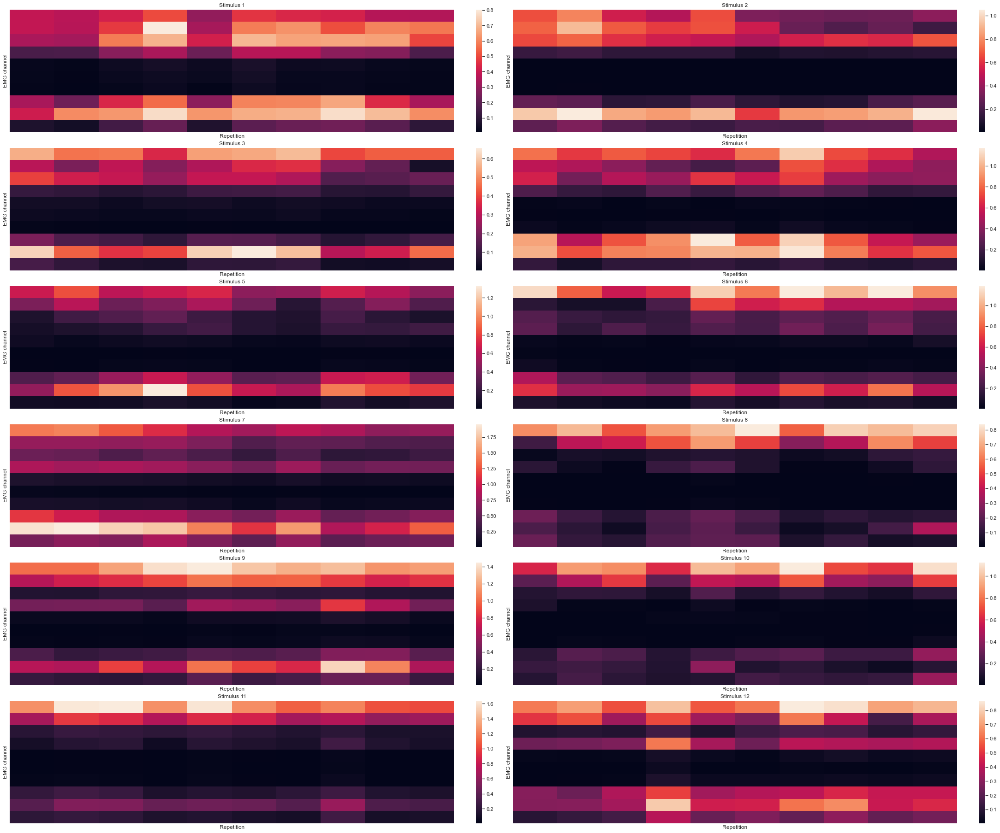

In [101]:
fig, ax = plt.subplots(6,2, figsize=(30, 25), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()

for stimuli_idx in range(n_stimuli):
    sns.heatmap(np.squeeze(emg_average_activations[:, stimuli_idx, :]), ax=ax[stimuli_idx] ,xticklabels=False, yticklabels=False, cbar = True)
    ax[stimuli_idx].title.set_text("Stimulus " + str(stimuli_idx + 1))
    ax[stimuli_idx].set_xlabel("Repetition")
    ax[stimuli_idx].set_ylabel("EMG channel")

Analysing this plots, we should see consistency across rows given that they represent repetitions of the same movement and the same recording location. To remove some trials, if we think needed, we should look to anomalies like abrupt changes - within each stimuli and across a specific row = same channel and != repetition.

for each stimuli, how diferent the columns are PER ROW --> because within one row for the same stimuli the signal should be similar because it is a repetition of the same thing

also we could think that low signal is bad but if it is equal for all repetitions might just be low activation!

In [118]:
#emg_average_activations has data for emg_average_activations[:, stimuli_idx, repetition_idx] 
#create a function that analysis each stimuli individually and returns repetition index of an trial where the signal is significantly diffrent from other trials 
#first approach see how differnet the mean signal is 

def trial_to_exclude(averaged_signal, stimuli_idx, threshold_factor=1.5):
    """
    Identify trials that significantly differ from others based on their mean signal.

    Parameters:
    - averaged_signal: (n_channels, n_stimuli, n_repetitions) Array of EMG signal averages.
    - stimuli_idx: Index of the stimulus to analyze (0-based).
    - threshold_factor: Factor to define significant difference (default: 2).

    Returns:
    - List of repetition indices to exclude.
    """
    # Extract the data for the current stimulus (shape: n_channels x n_repetitions)
    data_from_stimuli = averaged_signal[:, stimuli_idx, :]
    
    # Number of repetitions for this stimulus
    n_repetitions = averaged_signal.shape[2]
    
    # Compute the mean signal across all channels for each repetition
    mean_signals = np.zeros(n_repetitions)
    for repetition_idx in range(n_repetitions):
        mean_signals[repetition_idx] = np.mean(data_from_stimuli[:, repetition_idx])  # Mean across all channels

    # Compute the mean of the mean signals (overall mean across repetitions)
    overall_mean = np.mean(mean_signals)
    
    # Compute the standard deviation of the mean signals across repetitions
    std_dev = np.std(mean_signals)
    
    # Identify repetitions where the mean signal is more than `threshold_factor` times the standard deviation away from the overall mean
    deviation_from_mean = np.abs(mean_signals - overall_mean)
    
    # Mark repetitions whose deviation is greater than the threshold as anomalies
    trials_to_exclude = np.where(deviation_from_mean > threshold_factor * std_dev)[0]
    
    return trials_to_exclude

# `emg_average_activations` is an 3D array with dimensions (n_channels, n_stimuli, n_repetitions)
for stimuli_idx in range(n_stimuli):
    trials_to_exclude = trial_to_exclude(emg_average_activations, stimuli_idx)
    print(f"Trials to exclude for Stimulus {stimuli_idx + 1}: {trials_to_exclude+1}")

Trials to exclude for Stimulus 1: []
Trials to exclude for Stimulus 2: [2]
Trials to exclude for Stimulus 3: []
Trials to exclude for Stimulus 4: [7]
Trials to exclude for Stimulus 5: [4 7]
Trials to exclude for Stimulus 6: []
Trials to exclude for Stimulus 7: []
Trials to exclude for Stimulus 8: [5 7]
Trials to exclude for Stimulus 9: [8]
Trials to exclude for Stimulus 10: [10]
Trials to exclude for Stimulus 11: []
Trials to exclude for Stimulus 12: [4]


In the report we will show figures that show why this channels are removed.

PART 1.2.

In [119]:
def build_dataset_from_ninapro(emg, stimulus, repetition, features=None):

    '''Builds a dataset for machine learning by processing the EMG data.

    Parameters:
    - emg: 2D array of EMG signals (time steps x channels).
    - stimulus: 1D array with stimulus labels corresponding to the EMG data.
    - repetition: 1D array with repetition labels corresponding to the EMG data.
    - features: List of feature functions to extract from the EMG data.

    Returns:
    - dataset: 2D array of extracted features.
    - labels: 1D array of labels for each sample.
    '''

    # Calculate the number of unique stimuli and repetitions, subtracting 1 to exclude the resting condition
    n_stimuli = np.unique(stimulus).size - 1
    n_repetitions = np.unique(repetition).size - 1
    # Total number of samples is the product of stimuli and repetitions
    n_samples = n_stimuli * n_repetitions
    
    # Number of channels in the EMG data
    n_channels = emg.shape[1]
    # Calculate the total number of features by summing the number of channels for each feature
    n_features = sum(n_channels for feature in features)
    
    # Initialize the dataset and labels arrays with zeros
    dataset = np.zeros((n_samples, n_features))
    labels = np.zeros(n_samples)
    current_sample_index = 0
    
    # Loop over each stimulus and repetition to extract features
    for i in range(n_stimuli):
        for j in range(n_repetitions):
            # Assign the label for the current sample
            labels[current_sample_index] = i + 1
            # Calculate the current sample index based on stimulus and repetition
            current_sample_index = i * n_repetitions + j
            current_feature_index = 0
            # Select the time steps corresponding to the current stimulus and repetition
            selected_tsteps = np.logical_and(stimulus == i + 1, repetition == j + 1).squeeze()
            
            # Loop over each feature function provided
            for feature in features:
                # Determine the indices in the dataset where the current feature will be stored
                selected_features = np.arange(current_feature_index, current_feature_index + n_channels)
                # Apply the feature function to the selected EMG data and store the result
                dataset[current_sample_index, selected_features] = feature(emg[selected_tsteps, :])
                # Update the feature index for the next feature
                current_feature_index += n_channels

            # Move to the next sample
            current_sample_index += 1
            
    # Return the constructed dataset and corresponding labels
    return dataset, labels

In [67]:

# Create DataFrame for EMG data
num_points, N_channels = emg.shape
emg_df = pd.DataFrame(emg, columns=[f"Channel {i+1}" for i in range(N_channels)])
emg_df["Data Points"] = emg_df.index

diff = np.diff(stimulus.T).flatten()
change_points = [i + 1 for i, x in enumerate(diff) if x != 0]

# Plot each channel with change points
for channel in emg_df.columns[:-1]:  # Skip "Data Points"
    fig = px.line(
        emg_df,
        x="Data Points",
        y=channel,
        title=f"EMG Signal - {channel}",
        labels={"value": "Amplitude", "Data Points": "Data Points"},
    )

    # Add vertical dashed lines for change points
    for cp in change_points:
        fig.add_vline(
            x=cp,
            line_dash="dash",
            line_color="red",
            annotation_text="Change Point",
            annotation_position="top left",
        )

    # Enhance the layout for better readability
    fig.update_layout(
        xaxis_title="Data Points",
        yaxis_title="Amplitude",
        legend_title="Signal",
        template="plotly_white",
    )

    # Show the interactive plot
    fig.show()




KeyboardInterrupt: 